<a href="https://colab.research.google.com/github/123ujwal/123ujwal_Ted_talks_views_prediction/blob/main/Ted_Talks__Capstone_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Project** **Title** :- **Ted** **Talk** **Views** **Prediction**

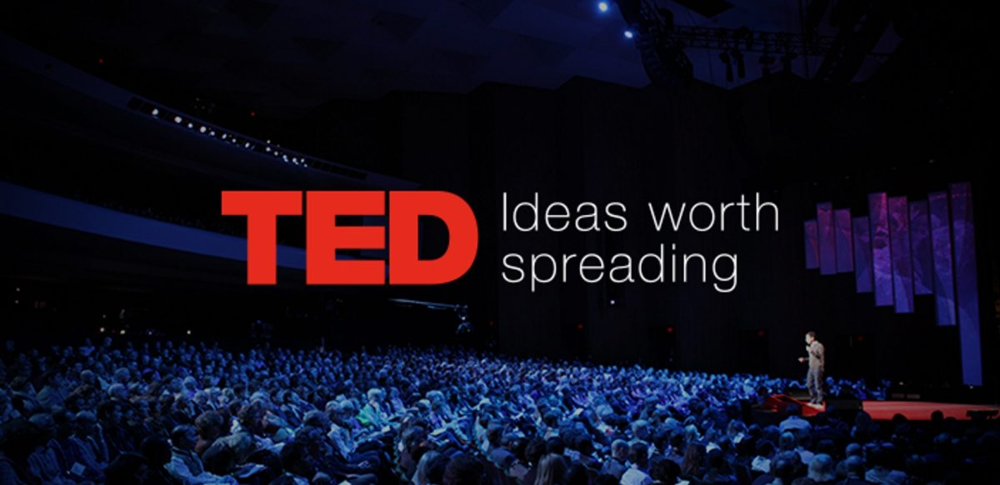


##Prediction :- Predict a TED talk’s popularity by its inherent features.

###Problem Description


TED is devoted to spreading powerful ideas on just about any topic. These datasets contain over 4,000 TED talks including transcripts in many languages.


Founded in 1984 by Richard Salman as a nonprofit organization that aimed at bringing experts from the fields of Technology, Entertainment, and Design together, TED Conferences have gone on to become the Mecca of ideas from virtually all walks of life.


As of 2015, TED and its sister TEDx chapters have published more than 2000 talks for free consumption by the masses and its speaker list boasts of the likes of Al Gore , Jimmy Wales, Shahrukh Khan, and Bill Gates.


The main objective is to build a predictive model, which could help in predicting the views of the videos uploaded on the TEDx website.


Data :- data_ted_talks.csv ( containing **4005** ted talk details)

##**Project** **Work** **flow**
### 1. Importing Libraries
### 2. Loading the Dataset
### 3. EDA on features
### 4. Feature Engineering
### 5. Data Cleaning
### 6. Feature selection
### 7. Fitting the regression models and HyperParameter Tuning
### 8. Comparison of Models
### 9. Final selection of the model
### 10. Conclusion

##Understanding the given Data
For each feature in the given dataset ,

What is the meaning of the feature and its data type


#**Installing** **and** **Importing** **Libraries**
##Libraries used in this Project:
### For Datawrangling :
     Numpy
     Pandas

##For Graphing :

     Matplotib
     Seaborn

##Machine learning :

     Scikit-Learn
     SK-Opt
     XGBoost

##Miscellaneous :

     Google colab tools

##1. **Importing** **few** **libraries**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from pylab import rcParams
import seaborn as sns 
sns.set()
from datetime import datetime

from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.decomposition import PCA

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings("ignore")

#**2**.**Loading** **the** **Dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Importing the dataset
working_path = '/content/drive/MyDrive/ALMA BETTER/Capstone project/data_ted_talks.csv'
ted = pd.read_csv(working_path)


##**Data** **Information**

In [ ]:
def DataInfoAll(df):
    print(f"Dataset Shape: {df.shape}")
    print("-"*75)
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    summary['First Value'] = df.iloc[0].values
    summary['Second Value'] = df.iloc[1].values
    return summary

In [ ]:
DataInfoAll(ted)

Dataset Shape: (4005, 19)
---------------------------------------------------------------------------


,Name,dtypes,Missing,Uniques,First Value,Second Value
0,talk_id,int64,0,4005,1,92
1,title,object,0,4005,Averting the climate crisis,The best stats you've ever seen
2,speaker_1,object,0,3274,Al Gore,Hans Rosling
3,all_speakers,object,4,3306,{0: 'Al Gore'},{0: 'Hans Rosling'}
4,occupations,object,522,2049,{0: ['climate advocate']},{0: ['global health expert; data visionary']}
5,about_speakers,object,503,2977,{0: 'Nobel Laureate Al Gore focused the world’...,"{0: 'In Hans Rosling’s hands, data sings. Glob..."
6,views,int64,0,3996,3523392,14501685
7,recorded_date,object,1,1334,2006-02-25,2006-02-22
8,published_date,object,0,2962,2006-06-27,2006-06-27
9,event,object,0,459,TED2006,TED2006


In [ ]:
ted.head(2)

,talk_id,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript
0,1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre..."
1,92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac..."


setting Talk_id as the index ,so that it can be used for quick indexing , using iloc , instead of needing to do dl.loc[ talk_id == talk_id ]

In [ ]:
ted = ted.set_index('talk_id')

In [ ]:
ted.head(2)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript
talk_id,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre..."
92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac..."


In [ ]:
ted.describe()

,views,comments,duration
count,4.005000e+03,3350.000000,4005.000000
mean,2.148006e+06,161.997015,724.011236
std,3.451226e+06,268.838922,361.775462
min,0.000000e+00,0.000000,60.000000
25%,8.820690e+05,38.000000,393.000000
50%,1.375508e+06,89.000000,738.000000
75%,2.133110e+06,188.000000,974.000000
max,6.505195e+07,6449.000000,3922.000000


In [ ]:
ted.describe(percentiles = [.25,.50,.75,.95,.99]).T

,count,mean,std,min,25%,50%,75%,95%,99%,max
views,4005.0,2.148006e+06,3.451226e+06,0.0,882069.0,1375508.0,2133110.0,6182301.40,16299833.68,65051954.0
comments,3350.0,1.619970e+02,2.688389e+02,0.0,38.0,89.0,188.0,531.65,1038.73,6449.0
duration,4005.0,7.240112e+02,3.617755e+02,60.0,393.0,738.0,974.0,1230.80,1601.12,3922.0


In [ ]:
ted.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4005 entries, 1 to 62794
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   title           4005 non-null   object 
 1   speaker_1       4005 non-null   object 
 2   all_speakers    4001 non-null   object 
 3   occupations     3483 non-null   object 
 4   about_speakers  3502 non-null   object 
 5   views           4005 non-null   int64  
 6   recorded_date   4004 non-null   object 
 7   published_date  4005 non-null   object 
 8   event           4005 non-null   object 
 9   native_lang     4005 non-null   object 
 10  available_lang  4005 non-null   object 
 11  comments        3350 non-null   float64
 12  duration        4005 non-null   int64  
 13  topics          4005 non-null   object 
 14  related_talks   4005 non-null   object 
 15  url             4005 non-null   object 
 16  description     4005 non-null   object 
 17  transcript      4005 non-null   

##**3**. **Exploratory** **Data** **Analysis**
###3.1 Let's check NaN values


In [ ]:
def NaN(df):
  result = pd.DataFrame({"Feature_Name":df.columns})
  result['Missing'] = df.isnull().sum().values    
  result['Uniques'] = df.nunique().values
  missing=[]
  rows = df.shape[0]
  for col in df.columns:
    missing_val = df[col].isnull().sum()
    missing_percentage = (missing_val/rows)*100
    missing_percentage = round(missing_percentage , 2)
    missing.append(missing_percentage)
  result['%age of missing values'] = missing
  result = result.sort_values( by = '%age of missing values' , ascending = False)
  return result

In [ ]:
NaN(ted)

,Feature_Name,Missing,Uniques,%age of missing values
11,comments,655,601,16.35
3,occupations,522,2049,13.03
4,about_speakers,503,2977,12.56
2,all_speakers,4,3306,0.10
6,recorded_date,1,1334,0.02
0,title,0,4005,0.00
16,description,0,4005,0.00
15,url,0,4005,0.00
14,related_talks,0,4005,0.00
13,topics,0,3977,0.00


In [ ]:
ted.isnull().sum()

title               0
speaker_1           0
all_speakers        4
occupations       522
about_speakers    503
views               0
recorded_date       1
published_date      0
event               0
native_lang         0
available_lang      0
comments          655
duration            0
topics              0
related_talks       0
url                 0
description         0
transcript          0
dtype: int64

###3.2 Let's check duplicate rows

In [ ]:
ted_duplicate_row = ted[ted.duplicated()]
if ted_duplicate_row.shape[0]:
  print(f"There are {ted_duplicate_row.shape[0]} duplicate observations present.")
else:
  print("There is no duplicate value present")

There is no duplicate value present


###3.3 Let's drop the null values
Here we are dropping rows where NaN values are present

In [ ]:
print(f"Before dropping the shape was {ted.shape}")
ted = ted.dropna(subset=['all_speakers' , 'occupations' , 'about_speakers' , 'recorded_date' , 'comments' ])
print(f"After dropping missing rows now the shape is {ted.shape}")

Before dropping the shape was (4005, 18)
After dropping missing rows now the shape is (3338, 18)


###Check for Null values

In [ ]:
ted.isnull().sum()

title             0
speaker_1         0
all_speakers      0
occupations       0
about_speakers    0
views             0
recorded_date     0
published_date    0
event             0
native_lang       0
available_lang    0
comments          0
duration          0
topics            0
related_talks     0
url               0
description       0
transcript        0
dtype: int64

In [ ]:
null_df=(((ted.isnull().sum()).sum())/ted.size)*100
null_df
print(f'There are {null_df}% of null values in the dataset')

There are 0.0% of null values in the dataset


In [ ]:
NaN(ted).T

,0,1,16,15,14,13,12,11,10,9,8,7,6,5,4,3,2,17
Feature_Name,title,speaker_1,description,url,related_talks,topics,duration,comments,available_lang,native_lang,event,published_date,recorded_date,views,about_speakers,occupations,all_speakers,transcript
Missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Uniques,3338,2823,3338,3338,3338,3329,1143,601,3274,12,428,2936,874,3334,2860,1987,2858,3338
%age of missing values,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##Thankfully there consists of no null data now.

In [ ]:
data = ted.copy()

## **Visualization** **Part**
###Visualization for numerical parts

1. visualization of Views

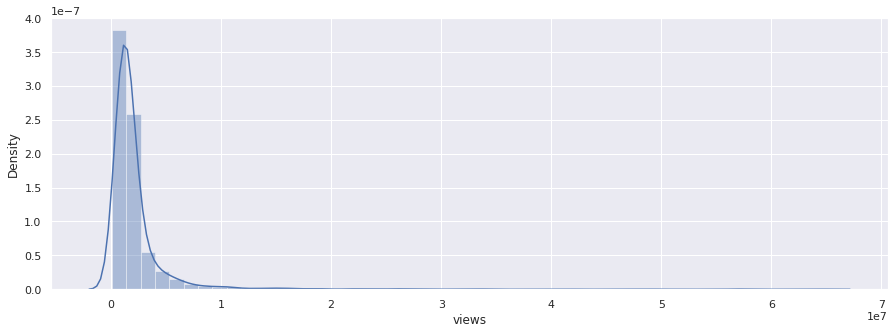

In [ ]:
#visualizing the distplot of views:
plt.figure(figsize=(15,5))
sns.distplot(data['views'])

Skewness is 0.520623908984116


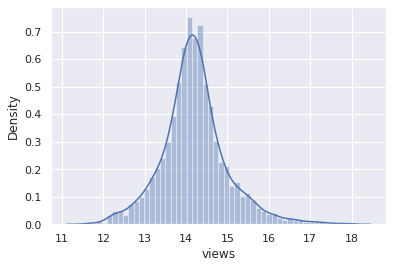

In [ ]:
#Log transformation for views as it is slightly right skewed
target = np.log(data['views'])
print ('Skewness is', target.skew())
sns.distplot(target)

2. visualization of Duration.

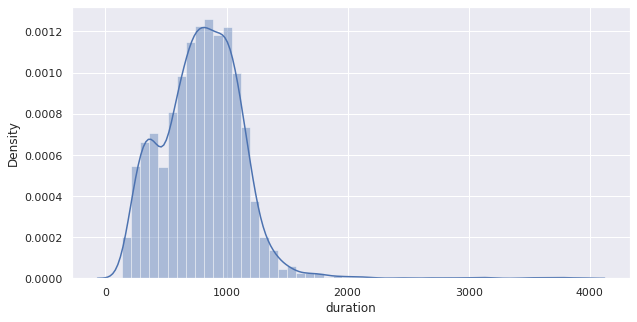

In [ ]:
#visualization of duration
plt.figure(figsize=(10,5))
sns.distplot(data['duration'])

3.visualization of comments

(-100.0, 1500.0, 0.0, 0.005)

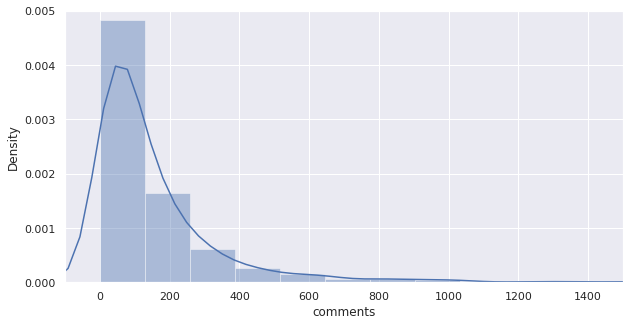

In [ ]:
##visualization of the comments
plt.figure(figsize=(10,5))
sns.distplot(data['comments'])
plt.axis([-100,1500 , 0 , 0.005])

##**4**.**Data** **Preprocessing** **and** **Feature** **Engineering**
Feature engineering is an informal topic, but one that is absolutely known and agreed to be key to success in applied machine learning.

###Adding a daily views column for further analysis:
Formatting Datetime type:

In [ ]:
# importing Datetime
from datetime import datetime
import calendar
# Setting the Datetime formate: 
today = datetime.now()
today.strftime('%Y-%m-%d')

'2022-04-25'

In [ ]:
data.head(2)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript
talk_id,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre..."
92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac..."


In [ ]:
data[['published_date' , 'recorded_date']].dtypes

published_date    object
recorded_date     object
dtype: object

In [ ]:
print(f'The datatype of each recorded_date is {type(data.recorded_date.iloc[0])}')
print(f'The datatype of each published_date is {type(data.published_date.iloc[0])}')

The datatype of each recorded_date is <class 'str'>
The datatype of each published_date is <class 'str'>


As you can see the datatype of recorded_date & published_date is in **object** **type** ,will change datatype to **datetime**

In [ ]:
# Recorded date fromat:
data['recorded_date']= pd.to_datetime(data['recorded_date'])
# Formating the published date time:
data['published_date']= pd.to_datetime(data['published_date'])

# Period of day's talk has been published:
last_publishing_date = data['published_date'].max()

data['time_since_published'] = last_publishing_date - pd.DatetimeIndex(data['published_date'])

In [ ]:
last_publishing_date

Timestamp('2020-04-28 00:00:00')

In [ ]:
print(f'The datatype of each recorded_date is {type(data.recorded_date.iloc[0])}')
print(f'The datatype of each published_date is {type(data.published_date.iloc[0])}')

The datatype of each recorded_date is <class 'pandas._libs.tslibs.timestamps.Timestamp'>
The datatype of each published_date is <class 'pandas._libs.tslibs.timestamps.Timestamp'>


In [ ]:
data[['published_date' , 'recorded_date']].dtypes

published_date    datetime64[ns]
recorded_date     datetime64[ns]
dtype: object

In [ ]:
data[['published_date' ,'time_since_published']].iloc[[18,10],:]

,published_date,time_since_published
talk_id,,
37,2006-08-21,4999 days
58,2006-07-25,5026 days


In [ ]:
months_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
days_order   = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

In [ ]:
data.head(2)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript,time_since_published
talk_id,,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre...",5054 days
92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac...",5054 days


In [ ]:
data.time_since_published.iloc[0]
a = str(data.time_since_published.iloc[0])
a

'5054 days 00:00:00'

###calender.month_abbr(int_value)
This will convert int_value to month like 1 to January , 5 to May


int_value must be in range(1,13)

In [ ]:
import calendar
print([calendar.month_abbr[i] for i in range(1,13)])

['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']


In [ ]:
import datetime
#Extracting published month from publish_date column
data['month'] = pd.DatetimeIndex(data['published_date']).month

# Converting month from 'Jan' to 1 like this
data['month'] = data['month'].apply(lambda x: calendar.month_abbr[x])

#Extracting published year from publish_date column
data['year'] = pd.DatetimeIndex(data['published_date']).year

#Extracting published day from publish_date column
data['day'] = pd.DatetimeIndex(data['published_date']).day

In [ ]:
pd.set_option("max_columns" , None)
pd.set_option("max_rows" , None)
data.head(2)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript,time_since_published,month,year,day
talk_id,,,,,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre...",5054 days,Jun,2006,27
92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac...",5054 days,Jun,2006,27


In [ ]:
data[['published_date' , 'month' ,'year' ,'day']].iloc[[1,92]]

,published_date,month,year,day
talk_id,,,,
92,2006-06-27,Jun,2006,27
110,2007-04-14,Apr,2007,14


###Creating daily views column:

In [ ]:
# Daily views/Talk:
data['daily_views'] = data['views'] / ( data['time_since_published'].apply(lambda x : x.days) + 1 )
data['daily_views'] = data['daily_views'].astype('int64')

In [ ]:
type(data['daily_views'].iloc[0])

numpy.int64

In [ ]:
data['daily_views'].describe(percentiles=[.25,.50,.75,.90,.95,.99])

count      3338.000000
mean       2625.750749
std       11223.928943
min          35.000000
25%         378.000000
50%         882.000000
75%        2000.000000
90%        5550.600000
95%        9378.150000
99%       21409.560000
max      464414.000000
Name: daily_views, dtype: float64

In [ ]:
daily_view = data[[ 'published_date', 'time_since_published' , 'views' , 'daily_views' ]]

daily_view.iloc[[628 , 57 , 2225] , :]

,published_date,time_since_published,views,daily_views
talk_id,,,,
820,2010-04-07,3674 days,2248059,611
60,2007-02-09,4827 days,1214012,251
2588,2016-09-26,1310 days,2712894,2069


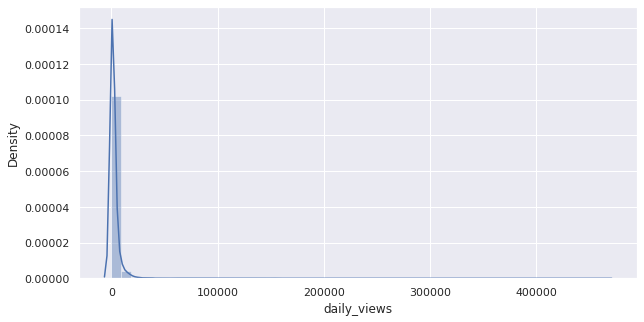

In [ ]:
##visualization of the daily views
plt.figure(figsize=(10,5))
sns.distplot(data['daily_views'])

The daily_views is positively skewed

In [ ]:
data.columns

Index(['title', 'speaker_1', 'all_speakers', 'occupations', 'about_speakers',
       'views', 'recorded_date', 'published_date', 'event', 'native_lang',
       'available_lang', 'comments', 'duration', 'topics', 'related_talks',
       'url', 'description', 'transcript', 'time_since_published', 'month',
       'year', 'day', 'daily_views'],
      dtype='object')

In [ ]:
d_= data[['published_date' , 'recorded_date' , 'time_since_published' , 'daily_views']]
d_.head(3)

,published_date,recorded_date,time_since_published,daily_views
talk_id,,,,
1,2006-06-27,2006-02-25,5054 days,697
92,2006-06-27,2006-02-22,5054 days,2868
7,2006-06-27,2006-02-24,5054 days,379


In [ ]:
data.head(1)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript,time_since_published,month,year,day,daily_views
talk_id,,,,,,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre...",5054 days,Jun,2006,27,697


###Categarising Variable types:
data_categorical= data[['title', 'speaker_1', 'all_speakers', 'occupations', 'about_speakers', 'native_lang', 'available_lang', 'comments', 'topics', 'related_talks', 'url', 'description', 'transcript']]
data_numerical= data[['talk_id','views', 'duration']]

data_target_variable(Y) = data[['views']]

In [ ]:
data_numerical= data[['views', 'duration']]

data_categorical= data[['title', 'speaker_1', 'all_speakers', 'occupations', 'about_speakers', 'native_lang', 'available_lang', 'comments', 'topics', 'related_talks', 'url', 'description', 'transcript']]

data_target_variable = data[['views']]

##Bivariate Analysis of different features vs. target variable

###Speaker_1 vs. daily_views:

  agg_filter: a filter function, which takes a (m, n, 3) float array and a dpi value, and returns a (m, n, 3) array
  alpha: float or None
  animated: bool
  backgroundcolor: color
  bbox: dict with properties for `.patches.FancyBboxPatch`
  clip_box: `.Bbox`
  clip_on: bool
  clip_path: Patch or (Path, Transform) or None
  color or c: color
  contains: callable
  figure: `.Figure`
  fontfamily or family: {FONTNAME, 'serif', 'sans-serif', 'cursive', 'fantasy', 'monospace'}
  fontproperties or font_properties: `.font_manager.FontProperties`
  fontsize or size: {size in points, 'xx-small', 'x-small', 'small', 'medium', 'large', 'x-large', 'xx-large'}
  fontstretch or stretch: {a numeric value in range 0-1000, 'ultra-condensed', 'extra-condensed', 'condensed', 'semi-condensed', 'normal', 'semi-expanded', 'expanded', 'extra-expanded', 'ultra-expanded'}
  fontstyle or style: {'normal', 'italic', 'oblique'}
  fontvariant or variant: {'normal', 'small-caps'}
  fontweight or weight: {a numeric

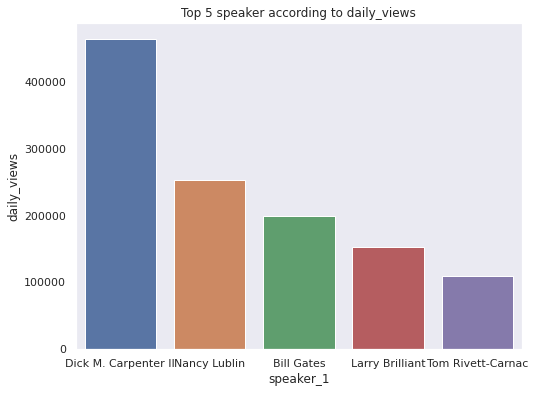

In [ ]:
#top 5 speakers
temp=data.groupby(['speaker_1'],as_index=False)['daily_views'].sum().sort_values('daily_views',ascending=False)[:5]
plt.figure(figsize=(8,6))
ax=sns.barplot(x='speaker_1', y='daily_views',data=temp)
plt.setp(ax.get_xticklabels());
plt.title('Top 5 speaker according to daily_views')
ax.grid(False)

###Speaker vs. talks delivered:

Text(0.5, 1.0, 'Top 5 speakers who delivered most talks')

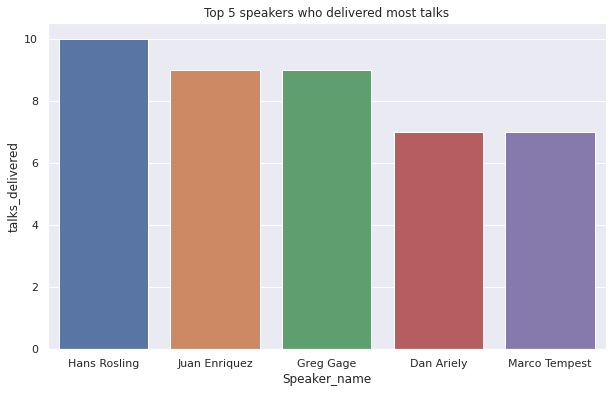

In [ ]:
#Speaker vs. talks delivered:
speaker_count = data['speaker_1'].value_counts().to_frame()
data_speaker_count = pd.DataFrame(speaker_count)
data_speaker_count = data_speaker_count.reset_index()
data_speaker_count.columns = ['Speaker_name', 'talks_delivered']
most_talks = data_speaker_count.nlargest(5, 'talks_delivered')
plt.figure(figsize=(10,6))
sns.barplot(x = 'Speaker_name', y = 'talks_delivered', data = most_talks)
plt.title("Top 5 speakers who delivered most talks")

###speaker vs. duration

  agg_filter: a filter function, which takes a (m, n, 3) float array and a dpi value, and returns a (m, n, 3) array
  alpha: float or None
  animated: bool
  backgroundcolor: color
  bbox: dict with properties for `.patches.FancyBboxPatch`
  clip_box: `.Bbox`
  clip_on: bool
  clip_path: Patch or (Path, Transform) or None
  color or c: color
  contains: callable
  figure: `.Figure`
  fontfamily or family: {FONTNAME, 'serif', 'sans-serif', 'cursive', 'fantasy', 'monospace'}
  fontproperties or font_properties: `.font_manager.FontProperties`
  fontsize or size: {size in points, 'xx-small', 'x-small', 'small', 'medium', 'large', 'x-large', 'xx-large'}
  fontstretch or stretch: {a numeric value in range 0-1000, 'ultra-condensed', 'extra-condensed', 'condensed', 'semi-condensed', 'normal', 'semi-expanded', 'expanded', 'extra-expanded', 'ultra-expanded'}
  fontstyle or style: {'normal', 'italic', 'oblique'}
  fontvariant or variant: {'normal', 'small-caps'}
  fontweight or weight: {a numeric

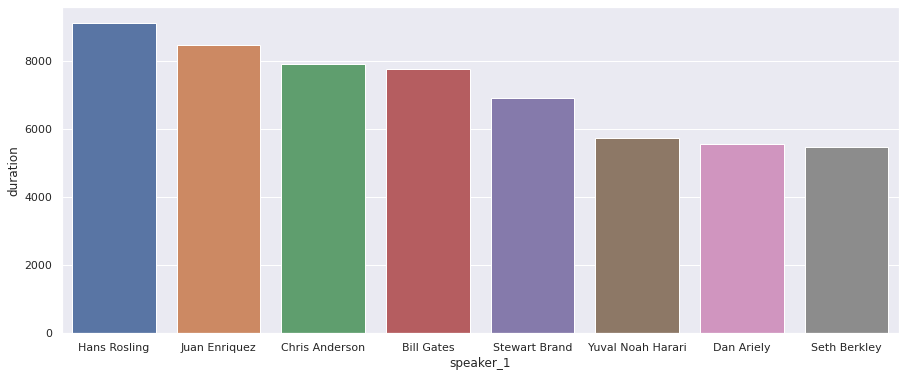

In [ ]:
#speaker vs. duration
temp=data.groupby(['speaker_1'],as_index=False)['duration'].sum().sort_values('duration',ascending=False)[:25]
temp=data.groupby(['speaker_1'],as_index=False).agg({'duration':'sum'}).sort_values('duration',ascending=False).reset_index()[:8]
# temp['talk_id']=temp['duration']/temp['talk_id']
plt.figure(figsize=(15,6))
ax=sns.barplot(x='speaker_1',y='duration',data=temp)
labels=ax.get_xticklabels()
plt.setp(labels);

###speaker vs comments

  agg_filter: a filter function, which takes a (m, n, 3) float array and a dpi value, and returns a (m, n, 3) array
  alpha: float or None
  animated: bool
  backgroundcolor: color
  bbox: dict with properties for `.patches.FancyBboxPatch`
  clip_box: `.Bbox`
  clip_on: bool
  clip_path: Patch or (Path, Transform) or None
  color or c: color
  contains: callable
  figure: `.Figure`
  fontfamily or family: {FONTNAME, 'serif', 'sans-serif', 'cursive', 'fantasy', 'monospace'}
  fontproperties or font_properties: `.font_manager.FontProperties`
  fontsize or size: {size in points, 'xx-small', 'x-small', 'small', 'medium', 'large', 'x-large', 'xx-large'}
  fontstretch or stretch: {a numeric value in range 0-1000, 'ultra-condensed', 'extra-condensed', 'condensed', 'semi-condensed', 'normal', 'semi-expanded', 'expanded', 'extra-expanded', 'ultra-expanded'}
  fontstyle or style: {'normal', 'italic', 'oblique'}
  fontvariant or variant: {'normal', 'small-caps'}
  fontweight or weight: {a numeric

Text(0.5, 1.0, 'Most popular speaker according to Comments')

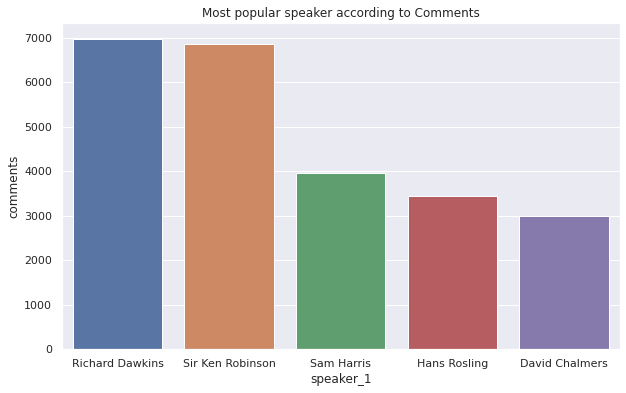

In [ ]:
temp=data.groupby(['speaker_1'],as_index=False)['comments'].sum().sort_values('comments',ascending=False)[:5]
plt.figure(figsize=(10,6))
ax=sns.barplot(x='speaker_1',y='comments',data=temp);
plt.setp(ax.get_xticklabels());
plt.title('Most popular speaker according to Comments')

###Speaker vs. Poular video

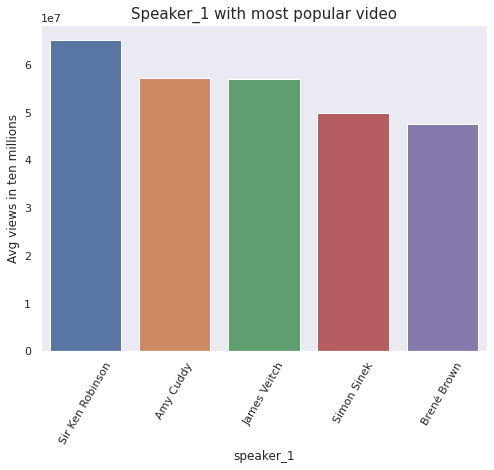

In [ ]:
# Speaker most popular video
temp=data[['speaker_1','views']].sort_values('views',ascending=False)[:5]
plt.figure(figsize=(8,6))
ax=sns.barplot(x='speaker_1',y='views',data=temp)
plt.setp(ax.get_xticklabels(), rotation=60);
plt.title('Speaker_1 with most popular video', fontsize = 15)
plt.ylabel('Avg views in ten millions')
ax.grid(False)

###Applying target encoding on speaker1

In [ ]:
speaker=data.groupby('speaker_1').agg({'daily_views' : 'mean'}).sort_values(['daily_views'],ascending=False)
speaker=speaker.to_dict()
speaker=speaker.values()
speaker=  list(speaker)[0]
data['speaker_1_avg_views']=data['speaker_1'].map(speaker)

In [ ]:
data.head(3)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript,time_since_published,month,year,day,daily_views,speaker_1_avg_views
talk_id,,,,,,,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre...",5054 days,Jun,2006,27,697,699.75
92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac...",5054 days,Jun,2006,27,2868,1099.10
7,Simplicity sells,David Pogue,{0: 'David Pogue'},{0: ['technology columnist']},{0: 'David Pogue is the personal technology co...,1920832,2006-02-24,2006-06-27,TED2006,en,"['ar', 'bg', 'de', 'el', 'en', 'es', 'fa', 'fr...",124.0,1286,"['computers', 'entertainment', 'interface desi...","{1725: '10 top time-saving tech tips', 2274: '...",https://www.ted.com/talks/david_pogue_simplici...,New York Times columnist David Pogue takes aim...,"(Music: ""The Sound of Silence,"" Simon & Garfun...",5054 days,Jun,2006,27,379,687.75


###plot speaker_1_avg_views:

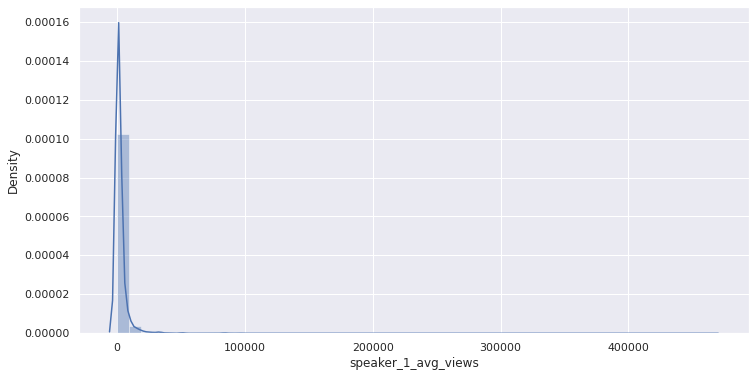

In [ ]:
plt.figure(figsize = (12 , 6))
sns.distplot(data.speaker_1_avg_views)

###Event_wise_avg_views

In [ ]:
event=data.groupby('event').agg({'daily_views' : 'mean'}).sort_values(['daily_views'],ascending=False)
event=event.to_dict()
event=event.values()
event=  list(event)[0]
data['event_wise_avg_views']=data['event'].map(event)

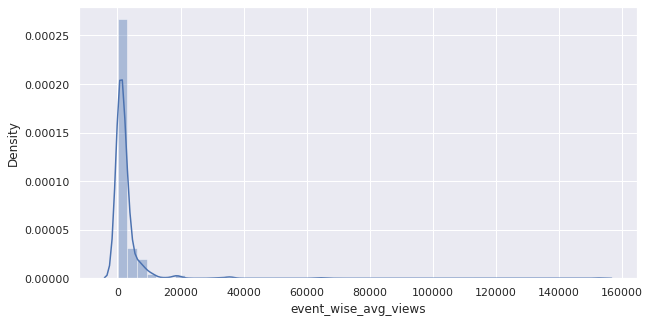

In [ ]:
plt.figure(figsize=(10,5))
sns.distplot(data['event_wise_avg_views'])

In [ ]:
data.reset_index()

,talk_id,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript,time_since_published,month,year,day,daily_views,speaker_1_avg_views,event_wise_avg_views
0,1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre...",5054 days,Jun,2006,27,697,699.750000,782.476190
1,92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac...",5054 days,Jun,2006,27,2868,1099.100000,782.476190
2,7,Simplicity sells,David Pogue,{0: 'David Pogue'},{0: ['technology columnist']},{0: 'David Pogue is the personal technology co...,1920832,2006-02-24,2006-06-27,TED2006,en,"['ar', 'bg', 'de', 'el', 'en', 'es', 'fa', 'fr...",124.0,1286,"['computers', 'entertainment', 'interface desi...","{1725: '10 top time-saving tech tips', 2274: '...",https://www.ted.com/talks/david_pogue_simplici...,New York Times columnist David Pogue takes aim...,"(Music: ""The Sound of Silence,"" Simon & Garfun...",5054 days,Jun,2006,27,379,687.750000,782.476190
3,53,Greening the ghetto,Majora Carter,{0: 'Majora Carter'},{0: ['activist for environmental justice']},{0: 'Majora Carter redefined the field of envi...,2664069,2006-02-26,2006-06-27,TED2006,en,"['ar', 'bg', 'bn', 'ca', 'cs', 'de', 'en', 'es...",219.0,1116,"['MacArthur grant', 'activism', 'business', 'c...",{1041: '3 stories of local eco-entrepreneurshi...,https://www.ted.com/talks/majora_carter_greeni...,"In an emotionally charged talk, MacArthur-winn...",If you're here today — and I'm very happy that...,5054 days,Jun,2006,27,527,453.000000,782.476190
4,66,Do schools kill creativity?,Sir Ken Robinson,{0: 'Sir Ken Robinson'},"{0: ['author', 'educator']}","{0: ""Creativity expert Sir Ken Robinson challe...",65051954,2006-02-25,2006-06-27,TED2006,en,"['af', 'ar', 'az', 'be', 'bg', 'bn', 'ca', 'cs...",4931.0,1164,"['children', 'creativity', 'culture', 'dance',...","{865: 'Bring on the learning revolution!', 173...",https://www.ted.com/talks/sir_ken_robinson_do_...,Sir Ken Robinson makes an entertaining and pro...,Good morning. How are you? (Audience) Good. It...,5054 days,Jun,2006,27,12868,6456.000000,782.476190
5,49,Behind the design of Seattle's library,Joshua Prince-Ramus,{0: 'Joshua Prince-Ramus'},{0: ['architect']},{0: 'Joshua Prince-Ramus is best known as arch...,1208138,2006-02-23,2006-07-10,TED2006,en,"['ar', 'bg', 'en', 'es', 'fr', 'he', 'it', 'ja...",48.0,1198,"['architecture', 'collaboration', 'culture', '...",{750: 'Building a theater that remakes itself'...,https://www.ted.com/talks/joshua_prince_ramus_...,Architect Joshua Prince-Ramus takes the audien...,I'm going to present three projects in rapid f...,5041 days,Jul,2006,10,239,240.000000,782.476190
6,86,Letting go of God,Julia Sweeney,{0: 'Julia Sweeney'},"{0: ['actor', 'comedian', 'playwright']}",{0: 'Julia Sweeney creates comedic works that ...,4636596,2006-02-24,2006-07-10,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",980.0,992,"['Christianity', 'God', 'atheism', 'comedy', '...","{22: 'Why people believe weird things', 94: ""L...",h

In [ ]:
data.head(2)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript,time_since_published,month,year,day,daily_views,speaker_1_avg_views,event_wise_avg_views
talk_id,,,,,,,,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre...",5054 days,Jun,2006,27,697,699.75,782.47619
92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac...",5054 days,Jun,2006,27,2868,1099.10,782.47619


In [ ]:
data['talk_id'] = data.index
data['number_of_lang'] = data['available_lang'].apply(lambda x: len(x))
data.head(5)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript,time_since_published,month,year,day,daily_views,speaker_1_avg_views,event_wise_avg_views,talk_id,number_of_lang
talk_id,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre...",5054 days,Jun,2006,27,697,699.75,782.47619,1,270
92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac...",5054 days,Jun,2006,27,2868,1099.10,782.47619,92,303
7,Simplicity sells,David Pogue,{0: 'David Pogue'},{0: ['technology columnist']},{0: 'David Pogue is the personal technology co...,1920832,2006-02-24,2006-06-27,TED2006,en,"['ar', 'bg', 'de', 'el', 'en', 'es', 'fa', 'fr...",124.0,1286,"['computers', 'entertainment', 'interface desi...","{1725: '10 top time-saving tech tips', 2274: '...",https://www.ted.com/talks/david_pogue_simplici...,New York Times columnist David Pogue takes aim...,"(Music: ""The Sound of Silence,"" Simon & Garfun...",5054 days,Jun,2006,27,379,687.75,782.47619,7,165
53,Greening the ghetto,Majora Carter,{0: 'Majora Carter'},{0: ['activist for environmental justice']},{0: 'Majora Carter redefined the field of envi...,2664069,2006-02-26,2006-06-27,TED2006,en,"['ar', 'bg', 'bn', 'ca', 'cs', 'de', 'en', 'es...",219.0,1116,"['MacArthur grant', 'activism', 'business', 'c...",{1041: '3 stories of local eco-entrepreneurshi...,https://www.ted.com/talks/majora_carter_greeni...,"In an emotionally charged talk, MacArthur-winn...",If you're here today — and I'm very happy that...,5054 days,Jun,2006,27,527,453.00,782.47619,53,219
66,Do schools kill creativity?,Sir Ken Robinson,{0: 'Sir Ken Robinson'},"{0: ['author', 'educator']}","{0: ""Creativity expert Sir Ken Robinson challe...",65051954,2006-02-25,2006-06-27,TED2006,en,"['af', 'ar', 'az', 'be', 'bg', 'bn', 'ca', 'cs...",4931.0,1164,"['children', 'creativity', 'culture', 'dance',...","{865: 'Bring on the learning revolution!', 173...",https://www.ted.com/talks/sir_ken_robinson_do_...,Sir Ken Robinson makes an entertaining and pro...,Good morning. How are you? (Audience) Good. It...,5054 days,Jun,2006,27,12868,6456.00,782.47619,66,387


In [ ]:
data.number_of_lang.describe()

count    3338.000000
mean      168.113841
std        53.184879
min         6.000000
25%       135.000000
50%       165.000000
75%       201.000000
max       454.000000
Name: number_of_lang, dtype: float64

(6.0, 475.0, 0.0, 0.013)

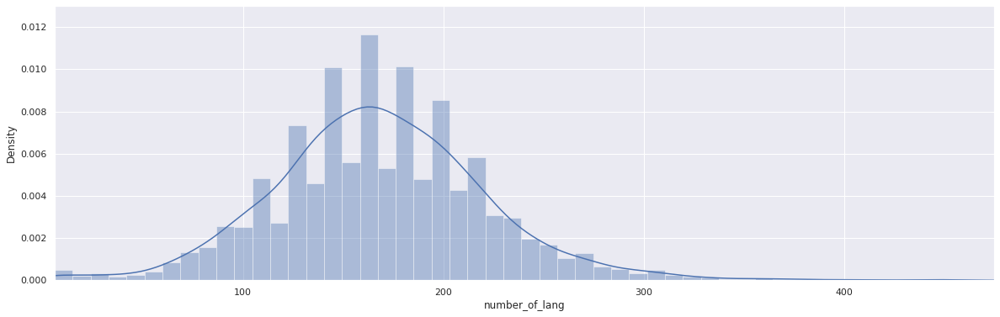

In [ ]:
plt.figure(figsize=(20,6))
sns.distplot(data['number_of_lang'])
plt.axis([6,475,0,0.013])

###How many languages available ??

In [ ]:
data.columns

Index(['title', 'speaker_1', 'all_speakers', 'occupations', 'about_speakers',
       'views', 'recorded_date', 'published_date', 'event', 'native_lang',
       'available_lang', 'comments', 'duration', 'topics', 'related_talks',
       'url', 'description', 'transcript', 'time_since_published', 'month',
       'year', 'day', 'daily_views', 'speaker_1_avg_views',
       'event_wise_avg_views', 'talk_id', 'number_of_lang'],
      dtype='object')

In [ ]:
data.native_lang.value_counts().to_frame().T

,en,es,fr,hi,de,pt,ko,zh-cn,ar,pt-br,ja,it
native_lang,3306,15,7,2,1,1,1,1,1,1,1,1


###Now will look into topics column

In [ ]:
data['topics'].head(3)

talk_id
1     ['alternative energy', 'cars', 'climate change...
92    ['Africa', 'Asia', 'Google', 'demo', 'economic...
7     ['computers', 'entertainment', 'interface desi...
Name: topics, dtype: object

In [ ]:
#let's check the datatype 
type(data['topics'].iloc[0])

str

In [ ]:
def convert_str_to_list_or_dict(data):
  return eval(data)
ted.loc[~ted['topics'].isna() , 'topics'] = ted.loc[~ted['topics'].isna() , 'topics'].apply(convert_str_to_list_or_dict)
ted.topics.head(3)

talk_id
1     [alternative energy, cars, climate change, cul...
92    [Africa, Asia, Google, demo, economics, global...
7     [computers, entertainment, interface design, m...
Name: topics, dtype: object

In [ ]:
#let's check the datatype again
type(data['topics'].iloc[0])
data['No_of_topics'] = data.topics.apply(lambda x: len(eval(x)))
data.head(2)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript,time_since_published,month,year,day,daily_views,speaker_1_avg_views,event_wise_avg_views,talk_id,number_of_lang,No_of_topics
talk_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre...",5054 days,Jun,2006,27,697,699.75,782.47619,1,270,9
92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190,"['Africa', 'Asia', 'Google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac...",5054 days,Jun,2006,27,2868,1099.10,782.47619,92,303,11


###Density plot of No_of_topics

Text(0.5, 1.0, 'Density plot for no_of_topics per talk')

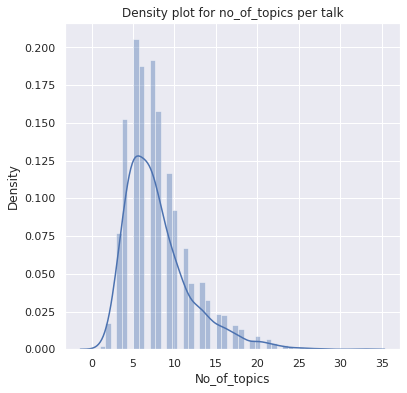

In [ ]:
plt.figure( figsize = (6 , 6))
sns.distplot(data['No_of_topics'])
plt.title("Density plot for no_of_topics per talk")

###Unique_topics

In [ ]:
data.topics.head()

talk_id
1     ['alternative energy', 'cars', 'climate change...
92    ['Africa', 'Asia', 'Google', 'demo', 'economic...
7     ['computers', 'entertainment', 'interface desi...
53    ['MacArthur grant', 'activism', 'business', 'c...
66    ['children', 'creativity', 'culture', 'dance',...
Name: topics, dtype: object

In [ ]:
data.topics = data.topics.apply(lambda x: x.lower())
data.topics.head()

talk_id
1     ['alternative energy', 'cars', 'climate change...
92    ['africa', 'asia', 'google', 'demo', 'economic...
7     ['computers', 'entertainment', 'interface desi...
53    ['macarthur grant', 'activism', 'business', 'c...
66    ['children', 'creativity', 'culture', 'dance',...
Name: topics, dtype: object

###Stroing all the unique_topics

In [ ]:
unique_topics = []
for list_of_topics in data.topics.values:
  list_of_topics = eval(list_of_topics)
  for topic in list_of_topics:
    topic = topic.lower()
    if topic not in unique_topics:
      unique_topics.append(topic)
    
unique_topics.sort()
len(unique_topics)

449

In [ ]:
for topic in unique_topics:
  print(topic , end=', ')

3d printing, activism, addiction, adventure, advertising, africa, aging, agriculture, ai, aids, aircraft, algorithm, alternative energy, alzheimer's, ancient world, animals, animation, antarctica, anthropocene, anthropology, ants, apes, archaeology, architecture, art, arts, asia, asteroid, astrobiology, astronomy, atheism, audacious project, augmented reality, autism, autism spectrum disorder, bacteria, beauty, bees, behavioral economics, best of the web, big bang, big problems, biodiversity, bioethics, biology, biomechanics, biomimicry, bionics, biosphere, biotech, birds, blindness, blockchain, body language, books, botany, brain, brand, brazil, buddhism, bullying, business, cancer, capitalism, cars, cello, charter for compassion, chemistry, children, china, choice, christianity, cities, climate change, cloud, code, cognitive science, collaboration, comedy, communication, community, compassion, complexity, composing, computers, conducting, consciousness, conservation, consumerism, coo

In [ ]:
data.columns

Index(['title', 'speaker_1', 'all_speakers', 'occupations', 'about_speakers',
       'views', 'recorded_date', 'published_date', 'event', 'native_lang',
       'available_lang', 'comments', 'duration', 'topics', 'related_talks',
       'url', 'description', 'transcript', 'time_since_published', 'month',
       'year', 'day', 'daily_views', 'speaker_1_avg_views',
       'event_wise_avg_views', 'talk_id', 'number_of_lang', 'No_of_topics'],
      dtype='object')

In [ ]:
data['topics'].iloc[0]

"['alternative energy', 'cars', 'climate change', 'culture', 'environment', 'global issues', 'science', 'sustainability', 'technology']"

In [ ]:
data[['topics' , 'No_of_topics']].head(1)

,topics,No_of_topics
talk_id,,
1,"['alternative energy', 'cars', 'climate change...",9


###Fetching the avg views w.r.t each topic in another dictionary unique_topics_avg_view_dict

In [ ]:
for topic in unique_topics:
  print(topic , end=', ')

3d printing, activism, addiction, adventure, advertising, africa, aging, agriculture, ai, aids, aircraft, algorithm, alternative energy, alzheimer's, ancient world, animals, animation, antarctica, anthropocene, anthropology, ants, apes, archaeology, architecture, art, arts, asia, asteroid, astrobiology, astronomy, atheism, audacious project, augmented reality, autism, autism spectrum disorder, bacteria, beauty, bees, behavioral economics, best of the web, big bang, big problems, biodiversity, bioethics, biology, biomechanics, biomimicry, bionics, biosphere, biotech, birds, blindness, blockchain, body language, books, botany, brain, brand, brazil, buddhism, bullying, business, cancer, capitalism, cars, cello, charter for compassion, chemistry, children, china, choice, christianity, cities, climate change, cloud, code, cognitive science, collaboration, comedy, communication, community, compassion, complexity, composing, computers, conducting, consciousness, conservation, consumerism, coo

In [ ]:
data[['topics' , 'daily_views']].head()

,topics,daily_views
talk_id,,
1,"['alternative energy', 'cars', 'climate change...",697
92,"['africa', 'asia', 'google', 'demo', 'economic...",2868
7,"['computers', 'entertainment', 'interface desi...",379
53,"['macarthur grant', 'activism', 'business', 'c...",527
66,"['children', 'creativity', 'culture', 'dance',...",12868


In [ ]:
unique_topics_avg_view_dict={}
for topic in unique_topics:
  total_views =0
  count=0
  i=0
  for list_of_topics in data.topics.values:
    list_of_topics = eval(list_of_topics)
    # print(type(list_of_topics))
    if(topic in list_of_topics):
      total_views +=data['daily_views'].iloc[i]
      count+=1
    i+=1
    if count==0:
      unique_topics_avg_view_dict[topic] = 0
    else:
      unique_topics_avg_view_dict[topic] = total_views//count

In [ ]:
len(unique_topics_avg_view_dict)

449

In [ ]:
d = pd.DataFrame({"Topic":list(unique_topics_avg_view_dict.keys()) ,
                  "Avg_Views": list(unique_topics_avg_view_dict.values())})
d.sort_values('Avg_Views' , inplace = True)
d.head()
d.shape

(449, 2)

In [ ]:
type(unique_topics_avg_view_dict['self'])

numpy.int64

In [ ]:
#storing the avg views w.r.t topic for each talk
topics_wise_avg_views=[]
for i in range(0,len(data)):
  temp=0
  list_of_Topics  = eval(data['topics'].iloc[i])
  for One_topic in list_of_Topics:
    temp +=float(unique_topics_avg_view_dict[One_topic])
  
  topics_wise_avg_views.append(temp//len(list_of_Topics))

topics_wise_avg_views_series = pd.Series(topics_wise_avg_views)
data['topics_wise_avg_views'] = topics_wise_avg_views_series.values

Let's use DataInfoAll

In [ ]:
DataInfoAll(data)

Dataset Shape: (3338, 29)
---------------------------------------------------------------------------


,Name,dtypes,Missing,Uniques,First Value,Second Value
0,title,object,0,3338,Averting the climate crisis,The best stats you've ever seen
1,speaker_1,object,0,2823,Al Gore,Hans Rosling
2,all_speakers,object,0,2858,{0: 'Al Gore'},{0: 'Hans Rosling'}
3,occupations,object,0,1987,{0: ['climate advocate']},{0: ['global health expert; data visionary']}
4,about_speakers,object,0,2860,{0: 'Nobel Laureate Al Gore focused the world’...,"{0: 'In Hans Rosling’s hands, data sings. Glob..."
5,views,int64,0,3334,3523392,14501685
6,recorded_date,datetime64[ns],0,874,2006-02-25 00:00:00,2006-02-22 00:00:00
7,published_date,datetime64[ns],0,2936,2006-06-27 00:00:00,2006-06-27 00:00:00
8,event,object,0,428,TED2006,TED2006
9,native_lang,object,0,12,en,en


##**5**. **Data** **Cleaning**
###Removing Outliers from numerical columns

In [ ]:
data_numeric = data[list(data.describe())]
data_numeric.head()

,views,comments,duration,time_since_published,year,day,daily_views,speaker_1_avg_views,event_wise_avg_views,talk_id,number_of_lang,No_of_topics,topics_wise_avg_views
talk_id,,,,,,,,,,,,,
1,3523392,272.0,977,5054 days,2006,27,697,699.75,782.47619,1,270,9,2184.0
92,14501685,628.0,1190,5054 days,2006,27,2868,1099.10,782.47619,92,303,11,2045.0
7,1920832,124.0,1286,5054 days,2006,27,379,687.75,782.47619,7,165,9,1994.0
53,2664069,219.0,1116,5054 days,2006,27,527,453.00,782.47619,53,219,9,2133.0
66,65051954,4931.0,1164,5054 days,2006,27,12868,6456.00,782.47619,66,387,7,2430.0


In [ ]:
data_numeric.columns

Index(['views', 'comments', 'duration', 'time_since_published', 'year', 'day',
       'daily_views', 'speaker_1_avg_views', 'event_wise_avg_views', 'talk_id',
       'number_of_lang', 'No_of_topics', 'topics_wise_avg_views'],
      dtype='object')

In [ ]:
# Aplying Outlier treatment on duration
sns.boxplot(data['duration'])
plt.figure( figsize = (8, 8))

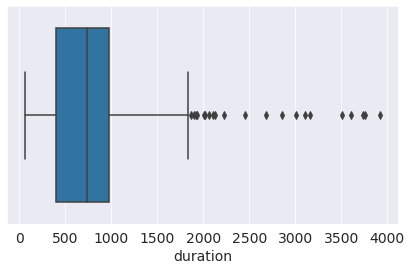


In [ ]:
data_duration_iqr=  data['duration'].quantile(0.75)-data['duration'].quantile(0.25)
data['duration']= data['duration'].mask(data['duration']>(data['duration'].quantile(0.75)+1.5*data_duration_iqr), data['duration'].mean())

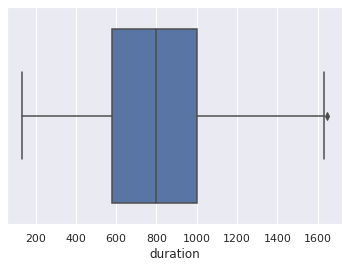

In [ ]:
# Aplying Outlier treatment on duration
sns.boxplot(data['duration'])


<Figure size 576x576 with 0 Axes>

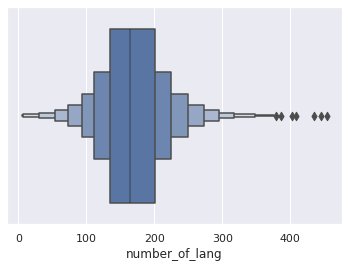

<Figure size 576x576 with 0 Axes>

In [ ]:
# Aplying Outlier treatment on number_of_lang
sns.boxenplot(data['number_of_lang'])
plt.figure( figsize = (8, 8))

In [ ]:
number_of_lang_iqr= (data['number_of_lang'].quantile(0.75))-(data['number_of_lang'].quantile(0.25))
data['number_of_lang']= data['number_of_lang'].mask(data['number_of_lang']>(data['number_of_lang'].quantile(0.75)+1.5*number_of_lang_iqr), data['number_of_lang'])

In [ ]:
# Aplying Outlier treatment on number_of_lang
sns.boxplot(data['number_of_lang'])
plt.figure( figsize = (8, 8))

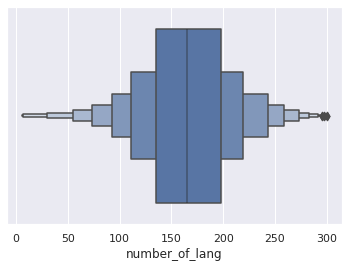

In [ ]:
temp_data1 = data.copy()
temp_data1.columns

Index(['title', 'speaker_1', 'all_speakers', 'occupations', 'about_speakers',
       'views', 'recorded_date', 'published_date', 'event', 'native_lang',
       'available_lang', 'comments', 'duration', 'topics', 'related_talks',
       'url', 'description', 'transcript', 'time_since_published', 'month',
       'year', 'day', 'daily_views', 'speaker_1_avg_views',
       'event_wise_avg_views', 'talk_id', 'number_of_lang', 'No_of_topics',
       'topics_wise_avg_views'],
      dtype='object')

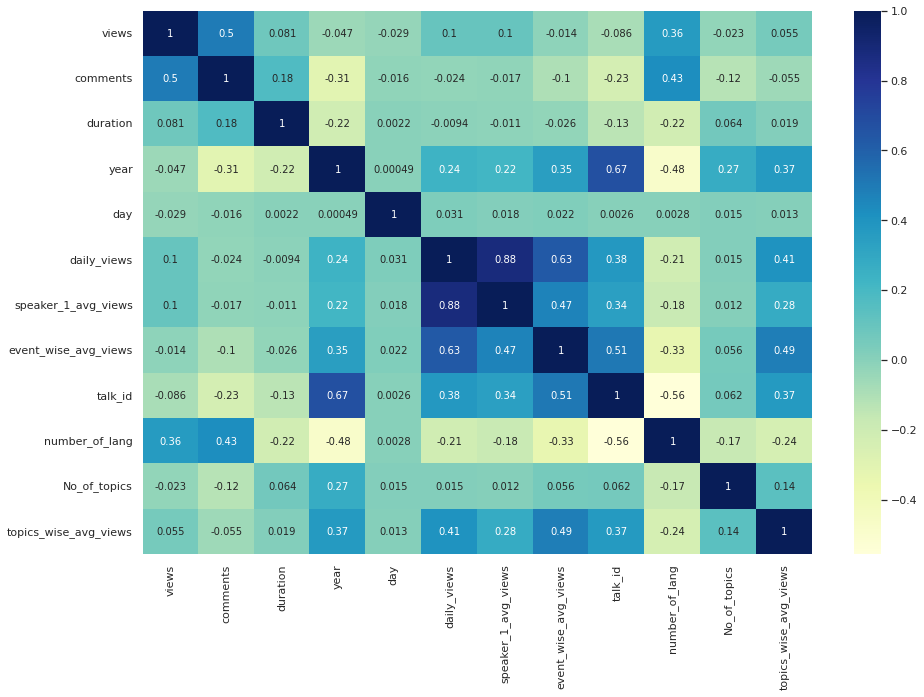

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(temp_data1.corr(), annot= True, cmap= "YlGnBu",ax=ax)

###Checking correlation


    Positive corr with dependent variable(daily_views)

            speaker_1_avg_views

            event_wise_avg_views

Now will remove irrelevant columns

In [ ]:
unwanted_features=['talk_id', 'title', 'speaker_1', 'all_speakers', 'occupations',
       'about_speakers', 'views', 'recorded_date', 'published_date', 'event',
       'native_lang', 'available_lang', 'topics',
       'related_talks', 'url', 'description', 'transcript']

In [ ]:
df=data.copy()
df.head(2)

,title,speaker_1,all_speakers,occupations,about_speakers,views,recorded_date,published_date,event,native_lang,available_lang,comments,duration,topics,related_talks,url,description,transcript,time_since_published,month,year,day,daily_views,speaker_1_avg_views,event_wise_avg_views,talk_id,number_of_lang,No_of_topics,topics_wise_avg_views
talk_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Averting the climate crisis,Al Gore,{0: 'Al Gore'},{0: ['climate advocate']},{0: 'Nobel Laureate Al Gore focused the world’...,3523392,2006-02-25,2006-06-27,TED2006,en,"['ar', 'bg', 'cs', 'de', 'el', 'en', 'es', 'fa...",272.0,977.0,"['alternative energy', 'cars', 'climate change...","{243: 'New thinking on the climate crisis', 54...",https://www.ted.com/talks/al_gore_averting_the...,With the same humor and humanity he exuded in ...,"Thank you so much, Chris. And it's truly a gre...",5054 days,Jun,2006,27,697,699.75,782.47619,1,270,9,2184.0
92,The best stats you've ever seen,Hans Rosling,{0: 'Hans Rosling'},{0: ['global health expert; data visionary']},"{0: 'In Hans Rosling’s hands, data sings. Glob...",14501685,2006-02-22,2006-06-27,TED2006,en,"['ar', 'az', 'bg', 'bn', 'bs', 'cs', 'da', 'de...",628.0,1190.0,"['africa', 'asia', 'google', 'demo', 'economic...","{2056: ""Own your body's data"", 2296: 'A visual...",https://www.ted.com/talks/hans_rosling_the_bes...,You've never seen data presented like this. Wi...,"About 10 years ago, I took on the task to teac...",5054 days,Jun,2006,27,2868,1099.10,782.47619,92,303,11,2045.0


In [ ]:
df.columns

Index(['title', 'speaker_1', 'all_speakers', 'occupations', 'about_speakers',
       'views', 'recorded_date', 'published_date', 'event', 'native_lang',
       'available_lang', 'comments', 'duration', 'topics', 'related_talks',
       'url', 'description', 'transcript', 'time_since_published', 'month',
       'year', 'day', 'daily_views', 'speaker_1_avg_views',
       'event_wise_avg_views', 'talk_id', 'number_of_lang', 'No_of_topics',
       'topics_wise_avg_views'],
      dtype='object')

In [ ]:
for i in unwanted_features:
  print(i , end=', ')

talk_id, title, speaker_1, all_speakers, occupations, about_speakers, views, recorded_date, published_date, event, native_lang, available_lang, topics, related_talks, url, description, transcript, 

In [ ]:
#dropping unimportant columns from the datasets.
df.drop(columns=unwanted_features,axis = 1,inplace=True)

In [ ]:
df.head(2)

,comments,duration,time_since_published,month,year,day,daily_views,speaker_1_avg_views,event_wise_avg_views,number_of_lang,No_of_topics,topics_wise_avg_views
talk_id,,,,,,,,,,,,
1,272.0,977.0,5054 days,Jun,2006,27,697,699.75,782.47619,270,9,2184.0
92,628.0,1190.0,5054 days,Jun,2006,27,2868,1099.10,782.47619,303,11,2045.0


###Let's check correlation matrix again!!

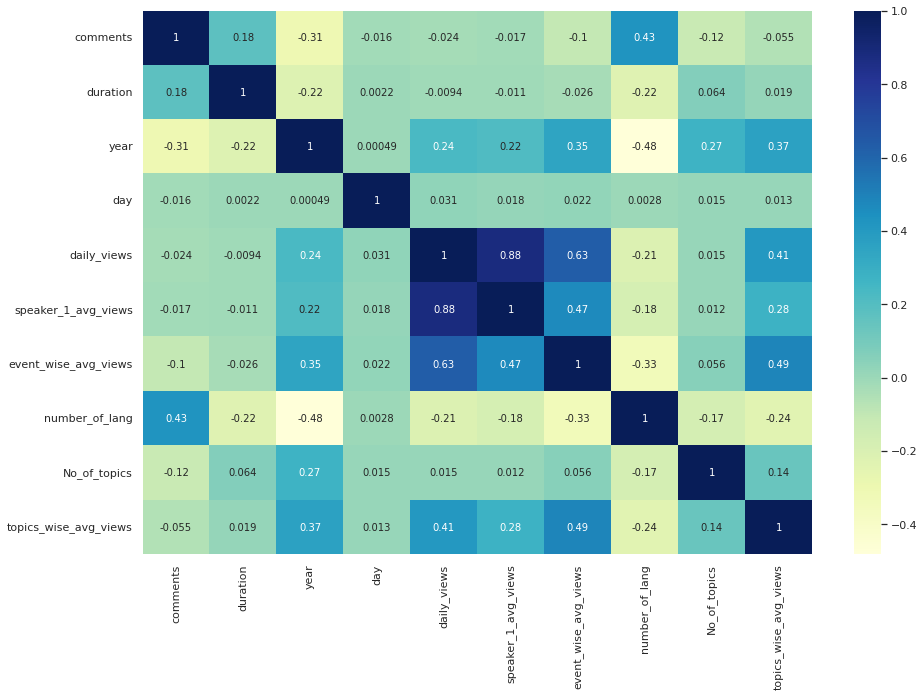

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(df.corr(), annot= True, cmap= "YlGnBu",ax=ax)

###Defining the dependent and independent variables.

In [ ]:
#separating the dependent and independent variables
y=df['daily_views']
X=data[['duration', 'speaker_1_avg_views', 'event_wise_avg_views','number_of_lang', 'No_of_topics', 'topics_wise_avg_views', 'year', 'day']]

In [ ]:
DataInfoAll(X)

Dataset Shape: (3338, 8)
---------------------------------------------------------------------------


,Name,dtypes,Missing,Uniques,First Value,Second Value
0,duration,float64,0,1109,977.00000,1190.00000
1,speaker_1_avg_views,float64,0,1978,699.75000,1099.10000
2,event_wise_avg_views,float64,0,419,782.47619,782.47619
3,number_of_lang,int64,0,165,270.00000,303.00000
4,No_of_topics,int64,0,29,9.00000,11.00000
5,topics_wise_avg_views,float64,0,1960,2184.00000,2045.00000
6,year,int64,0,15,2006.00000,2006.00000
7,day,int64,0,31,27.00000,27.00000


In [ ]:
X2 = X
X2.head()

,duration,speaker_1_avg_views,event_wise_avg_views,number_of_lang,No_of_topics,topics_wise_avg_views,year,day
talk_id,,,,,,,,
1,977.0,699.75,782.47619,270,9,2184.0,2006,27
92,1190.0,1099.10,782.47619,303,11,2045.0,2006,27
7,1286.0,687.75,782.47619,165,9,1994.0,2006,27
53,1116.0,453.00,782.47619,219,9,2133.0,2006,27
66,1164.0,6456.00,782.47619,387,7,2430.0,2006,27


###Let's split dataset into 80:20 ratio

In [ ]:
x_train , x_test , y_train , y_test = train_test_split(X , y , random_state = 1)

In [ ]:
print("Shape of x_train ",x_train.shape)
print("Shape of x_test ",x_test.shape)
print("Shape of y_train ",y_train.shape)
print("Shape of y_test ",x_test.shape)

Shape of x_train  (2503, 8)
Shape of x_test  (835, 8)
Shape of y_train  (2503,)
Shape of y_test  (835, 8)


##**6**. **Feature** **Scaling**

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

##**7**. **Model** **Selection** **and** **Comparison**
Problem can be identified as Regression
Dataset has very less records
Idea is to start selection of models as:
###1. Linear Regression
###2. Lasso
###3. Ridge
###4. KNeighborsRegressor
###5. Random Forest
###6. ExtraTreeRegressor
###7. GradientBoostingRegressor
###8. XGBRegressior

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import ExtraTreeRegressor
# from sklearn.emsemble import GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor

In [ ]:
ExtraTreeRegressor()

ExtraTreeRegressor()

In [ ]:
#Defining all these models
models = [
          ['Linear Reg.: ', LinearRegression()],
           ['Lasso: ', Lasso()],
           ['Ridge: ', Ridge()],
           ['KNeighborsRegressor: ',  KNeighborsRegressor()],
           ['RandomForest ',RandomForestRegressor(criterion='mae',max_depth=6,min_samples_leaf=30,min_samples_split=80,n_estimators=150,random_state=42)],
           ['ExtraTreeRegressor :',ExtraTreeRegressor(criterion='mae',max_depth=6, min_samples_leaf=40,min_samples_split=100)],
           ['GradientBoostingRegressor: ', GradientBoostingRegressor()] ,
           ['XGBRegressor: ', XGBRegressor(base_score=0.5, booster='gbtree',colsample_bytree=1, gamma=0,importance_type='gain', learning_rate=0.1,max_depth=4, min_samples_leaf=40,
             min_samples_split=150, n_estimators=80)]          
        ]

In [ ]:
from sklearn import metrics

In [ ]:
#Let's run all the models and store the scores
model_data = []
for name,curr_model in models :
    curr_model_data = {}
    curr_model.random_state = 78
    curr_model_data["Name"] = name
    curr_model.fit(x_train,y_train)
    curr_model_data["MAE_train"] =metrics.mean_absolute_error(y_train, curr_model.predict(x_train))
    curr_model_data["MAE_test"] =metrics.mean_absolute_error(y_test, curr_model.predict(x_test))
    curr_model_data["R2_Score_train"] = r2_score(y_train,curr_model.predict(x_train))
    curr_model_data["R2_Score_test"] = r2_score(y_test,curr_model.predict(x_test))
    curr_model_data["RMSE_Score_train"] = np.sqrt(mean_squared_error(y_train,curr_model.predict(x_train)))
    curr_model_data["RMSE_Score_test"] = np.sqrt(mean_squared_error(y_test,curr_model.predict(x_test)))
    model_data.append(curr_model_data)

[06:21:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
#printing the results dataframe
results_df = pd.DataFrame(model_data)
results_df

,Name,MAE_train,MAE_test,R2_Score_train,R2_Score_test,RMSE_Score_train,RMSE_Score_test
0,Linear Reg.:,1273.691038,1206.912821,0.859354,0.703745,4535.364639,4389.238949
1,Lasso:,1273.029303,1206.188964,0.859354,0.703929,4535.365518,4387.879422
2,Ridge:,1273.324999,1206.370328,0.859354,0.704067,4535.366371,4386.853150
3,KNeighborsRegressor:,1022.574031,901.329820,0.542084,0.922548,8183.538612,2244.265121
4,RandomForest,921.456527,838.850651,0.168242,0.335712,11029.274444,6572.560299
5,ExtraTreeRegressor :,1346.414702,1333.508982,0.145279,0.272744,11180.481341,6877.018153
6,GradientBoostingRegressor:,374.449641,746.381625,0.994977,0.487640,857.117126,5772.233568
7,XGBRegressor:,428.974035,667.745983,0.993252,0.780386,993.452962,3779.081888


###We choose **MAE** and not **RMSE** as the deciding factor of our model selection because of the following reasons:

1. RMSE is heavily influenced by outliers as in the higher the values get the more the RMSE increases.
2. MAE doesn’t increase with outliers. MAE is linear and RMSE is quadratically increasing.

The best performing regressor model for this dataset is **XGBRegressor** on the basis of **MAE**.

In [ ]:
results_df.sort_values(by=['MAE_train' , 'MAE_test'])

,Name,MAE_train,MAE_test,R2_Score_train,R2_Score_test,RMSE_Score_train,RMSE_Score_test
6,GradientBoostingRegressor:,374.449641,746.381625,0.994977,0.487640,857.117126,5772.233568
7,XGBRegressor:,428.974035,667.745983,0.993252,0.780386,993.452962,3779.081888
4,RandomForest,921.456527,838.850651,0.168242,0.335712,11029.274444,6572.560299
3,KNeighborsRegressor:,1022.574031,901.329820,0.542084,0.922548,8183.538612,2244.265121
1,Lasso:,1273.029303,1206.188964,0.859354,0.703929,4535.365518,4387.879422
2,Ridge:,1273.324999,1206.370328,0.859354,0.704067,4535.366371,4386.853150
0,Linear Reg.:,1273.691038,1206.912821,0.859354,0.703745,4535.364639,4389.238949
5,ExtraTreeRegressor :,1346.414702,1333.508982,0.145279,0.272744,11180.481341,6877.018153


Gradient Boosting worked well out of this 8 models but for test data r2 score is very low (0.48),
that's why we are going to use XGBRegressor as final model,

### Let's do hyperparameter tuning to improve the model again

##**8**. **Hyperparameter** **tuning**

In [ ]:
from sklearn.model_selection import cross_val_score , ShuffleSplit , GridSearchCV

In [ ]:
FinalModel = XGBRegressor()

In [ ]:
params = {
     'gamma' : [ -0.5, 0, 0.5, 1],
    'learning_rate' :[0.001, 0.01, 0.1, 5,10 ],
    'n_estimators' : [25,50,75,100] ,
    'max_depth' : [3, 5,10]
        }

In [ ]:
gridsearch = GridSearchCV(FinalModel , params , cv=2 , return_train_score=True)

In [ ]:
gridsearch.fit(x_train , y_train )

[06:22:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:22:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:22:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:22:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:22:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:22:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:22:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:22:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

GridSearchCV(cv=2, estimator=XGBRegressor(),
             param_grid={'gamma': [-0.5, 0, 0.5, 1],
                         'learning_rate': [0.001, 0.01, 0.1, 5, 10],
                         'max_depth': [3, 5, 10],
                         'n_estimators': [25, 50, 75, 100]},
             return_train_score=True)

In [ ]:
print(gridsearch.best_params_)

{'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}


In [ ]:
gridsearch_predictions = gridsearch.predict( x_test ) 

In [ ]:
XGBRegressor_with_hyper = []
XGBRegressor_with_hyper.append("XGBRegressor_with_hyper")
XGBRegressor_with_hyper.append(metrics.mean_absolute_error(y_train, gridsearch.predict(x_train)))
XGBRegressor_with_hyper.append(metrics.mean_absolute_error(y_test, gridsearch.predict(x_test)))
XGBRegressor_with_hyper.append(r2_score(y_train,gridsearch.predict(x_train)))
XGBRegressor_with_hyper.append(r2_score(y_test,curr_model.predict(x_test)))
XGBRegressor_with_hyper.append(np.sqrt(mean_squared_error(y_train,gridsearch.predict(x_train))))
XGBRegressor_with_hyper.append(np.sqrt(mean_squared_error(y_test,gridsearch.predict(x_test))))

In [ ]:
XGBRegressor_without_hyper = [ "XGBRegressor_without_hyper" , 429.888181,	680.397815,	0.993294,	0.766717,	990.312172,	3894.911052]

In [ ]:
results_df.columns

Index(['Name', 'MAE_train', 'MAE_test', 'R2_Score_train', 'R2_Score_test',
       'RMSE_Score_train', 'RMSE_Score_test'],
      dtype='object')

In [ ]:
Result = pd.DataFrame([ XGBRegressor_without_hyper , XGBRegressor_with_hyper] , columns=results_df.columns)
Result.set_index(Result.Name)
Result

,Name,MAE_train,MAE_test,R2_Score_train,R2_Score_test,RMSE_Score_train,RMSE_Score_test
0,XGBRegressor_without_hyper,429.888181,680.397815,0.993294,0.766717,990.312172,3894.911052
1,XGBRegressor_with_hyper,339.986167,663.406776,0.996143,0.780386,751.065233,3684.145179


Will use Gradient Boosting without hyperparameter

#**9**. **Conclusion**

###That's it! We reached the end of our exercise.


Started with loading the data so far we have done EDA ,feature engineering , data cleaning, target encoding and one hot encoding of categorical columns, feature selection and then model building.

###So far we have modelled on

**Linear** **Regressor** 


**Lasso** **Regressor**


**Ridge** **Regressor**


**KNearest** **Neighbors** **Regressor**


**Random** **Forest** **Regressor**


**Extra** **Tree** **Regressor**


**Gradient** **Boosting** **Regressor**


**XGB** **Regressor**

##### Most of the columns are categorical

##### After hyper parameter tuning, we have prevented overfitting
##### The target variable is highly correlated with sepaker_1_average_views & event_wise_avg_view.
##### Out of all these models XGBRegressor is the best performer in terms of MAE.
##### Most of the talks are available in English.
##### In all the features speaker_wise_avg_views is most important this implies that speakers are directly impacting the views.
##### Hans Rosling delivered most of the talks .
##### According to the number of comments Richard Dawkins is the most popular speaker

##**10**. **Future** **Work**
We can do a dynamic regression time series modelling due to the availability of the time features.


We can use topic modelling to tackle views in each topic separately.

#**Thank** **You**